In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import numpy as np
import torch
from tqdm.notebook import tqdm, trange

from ddpm import *

device = torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
torch.manual_seed(1984)

# 初始化模型
latent_dim = 256
hidden_dims = [2048, 2048, 2048, 2048] 
max_freq = 4  # Example max frequency for Fourier features
num_bands = 4  # Number of frequency bands
scalar_hidden_dims = [256,256,256,256]
diffusion_model = LatentDiffusionModel(latent_dim, hidden_dims, scalar_hidden_dims, max_freq, num_bands).to(device)
# diffusion_ckpt_path = "/home/ziran/se3/EFEM/lib_shape_prior/dev_ckpt/mugs_ddpm_cos_20k_test1/model.pth"
# diffusion_ckpt_path = "/home/ziran/se3/EFEM/lib_shape_prior/dev_ckpt/mugs_ddpm_cos_20k_l2loss/model.pth"
diffusion_ckpt_path = "/home/ziran/se3/EFEM/lib_shape_prior/dev_ckpt/mugs_ddpm_cos_30k_l2_normT/model.pth"
# diffusion_ckpt_path = "/home/ziran/se3/EFEM/lib_shape_prior/dev_ckpt/NEWmugs_ddpm_cos_10k_l1huber/model.pth"
diffusion_ckpt = torch.load(diffusion_ckpt_path)
diffusion_model.load_state_dict(diffusion_ckpt['model'])
diffusion_model = diffusion_model.to(device)
print('Diffusion Model parameters:', sum(p.numel() for p in diffusion_model.parameters()))

Using device: cuda:2
Diffusion Model parameters: 51956544


In [2]:
from init import get_AEmodel_cfg
from core.models import get_model
category = "mugs"
# category = "kit4cates"
# category = "chairs"
config_Only_model = get_AEmodel_cfg()
ModelClass = get_model(config_Only_model["model"]["model_name"])
model = ModelClass(config_Only_model)
ckpt_path = f"/home/ziran/se3/EFEM/weights/{category}.pt"
# ckpt_path = f"/home/ziran/se3/EFEM/lib_shape_prior/log/12_10_shape_prior_mugs_old/12_10_shape_prior_mugs_FOR_hopefullybetterAE/checkpoint/15409.pt"
ckpt = torch.load(ckpt_path)
model.network.load_state_dict(ckpt['model_state_dict'])
model.network = model.network.to(device)

bs = 3


In [3]:
# train_loader = DataLoader(
#     dataset=train_ds, batch_size=bs, shuffle=False,
#     num_workers=4, pin_memory=True
# )
# # 获取第一个批次
# batch = next(iter(train_loader))

# query = batch[0]['inputs'].to(device=device, dtype=torch.float32)
# query_mask = (1-batch[0]["inputs_outlier_mask"]).bool()


In [4]:
# path = "/home/ziran/se3/EFEM/data/ShapeNetV1_SDF/03797390/1a1c0a8d4bad82169f0594e65f756cf5/pointcloud.npz"
# data = np.load(path)
# points = data['points']

# # 随机选取点云的一个子集
# sample_size = int(len(points) * 0.1)
# indices = np.random.choice(len(points), sample_size, replace=False)
# points = points[indices]
# print(points.shape)

# query = torch.from_numpy(points).unsqueeze(0).repeat(bs, 1, 1).to(device=device, dtype=torch.float32)
# query_mask = torch.ones(query.shape[:2]).bool()
# query.shape, query_mask.shape

In [5]:
# 读取文件
data = np.loadtxt('./dev_utils/test.sdf')

# 分离点云位置和SDF值
points = data[:, :3]  # 取前三列为点云位置
sdf_values = data[:, 3]  # 取第四列为SDF值

# 检查结果
print("Points shape:", points.shape)
print("SDF Values shape:", sdf_values.shape)

query = torch.from_numpy(points).unsqueeze(0).repeat(bs, 1, 1).to(device=device, dtype=torch.float32)
sdf_values = torch.from_numpy(sdf_values).unsqueeze(0).repeat(bs, 1).to(device=device, dtype=torch.float32)
query_mask = torch.ones(query.shape[:2]).bool()
print("query max,min: ",query.max(), query.min())
print("query_sdf max,min: ",sdf_values.max(), sdf_values.min())
query.shape, query_mask.shape, sdf_values.shape

Points shape: (3003, 3)
SDF Values shape: (3003,)
query max,min:  tensor(0.3561, device='cuda:2') tensor(-0.3559, device='cuda:2')
query_sdf max,min:  tensor(0.0010, device='cuda:2') tensor(-0.0010, device='cuda:2')


(torch.Size([3, 3003, 3]), torch.Size([3, 3003]), torch.Size([3, 3003]))

In [6]:
model.network.requires_grad_(True)

def clamp(x, sigma):
    return torch.clamp(x, -sigma, sigma)

SIGMA = 2

loss_l1 = torch.nn.L1Loss()
loss_mse = torch.nn.MSELoss()

def get_recon_score(x, query, query_mask, sdf_gt = None):
    with torch.enable_grad():
        model.network.zero_grad()
        x = x.detach().requires_grad_(True)
        
        pred_so3_feat, pred_inv_feat = x[:,:,:3], x[:,:,3]

        pred_scale = (torch.ones(bs) + 0.2).to(device)
        pred_center = torch.zeros(bs, 1, 3).to(device)
        
        embedding = {
            "z_so3": pred_so3_feat, # [B, 256, 3]
            "z_inv": pred_inv_feat, # [B, 256]
            "s": pred_scale, # [B]
            "t": pred_center, # [B, 1, 3]
        }

        sdf_hat = model.network.decode(
            query,
            None,
            embedding,
            return_sdf=True,
        )
        if sdf_gt is None:
            sdf_gt = torch.zeros_like(query_mask, device=device, dtype=torch.float32)
        
        sdf_hat = clamp(sdf_hat[query_mask], SIGMA)
        sdf_gt = clamp(sdf_gt[query_mask], SIGMA)

        # loss = F.mse_loss(sdf_hat[query_mask], sdf_gt[query_mask], reduction='mean')
        # loss = F.mse_loss(sdf_hat, sdf_gt, reduction='mean')
        loss = loss_l1(sdf_hat, sdf_gt)

        # loss = torch.abs(sdf_hat - sdf_gt).mean()
        loss_item = loss.item()

        # loss.backward()
        grad_x = torch.autograd.grad(loss, x)[0].detach().requires_grad_(False)

        # 清理不再需要的变量和显存
        del pred_so3_feat, pred_inv_feat, sdf_hat, loss, embedding, pred_scale, pred_center
        torch.cuda.empty_cache()

        return grad_x, loss_item

codebook_path = f"/home/ziran/se3/EFEM/cache/mugs.npz"
# codebook_path = f"/home/ziran/se3/EFEM/lib_shape_prior/log/12_10_shape_prior_mugs_old/12_10_shape_prior_mugs_FOR_hopefullybetterAE/codebook.npz"
train_ds = CustomDataset(codebook_path)
x_gt = train_ds[2][0].unsqueeze(0).repeat(bs, 1, 1).to(device=device, dtype=torch.float32)

def get_feature_recon_loss(x, x_gt):
    x = x.detach().requires_grad_(True)
    with torch.enable_grad():
        # loss = loss_mse(x, x_gt)
        loss = loss_l1(x, x_gt)
        loss_item = loss.item()
        return torch.autograd.grad(loss, x)[0].float(), loss_item
    


def get_fixed_query_pc(bs):
    N = 50
    space_dim = [N, N, N]  # 示例为一个50x50x50的网格
    di = 0.5
    x = np.linspace(-di, di, space_dim[0])
    y = np.linspace(-di, di, space_dim[1])
    z = np.linspace(-di, di, space_dim[2])
    X, Y, Z = np.meshgrid(x, y, z, indexing='ij')
    viz_query = np.stack([X.ravel(), Y.ravel(), Z.ravel()], axis=-1)
    viz_query = torch.tensor(viz_query,dtype=torch.float32).to(device)
    viz_query = viz_query.repeat(bs, 1, 1)
    return viz_query
fixed_query_pc = get_fixed_query_pc(bs)

def get_feature_recon_AEloss(x, x_gt, fixed_pc=True):
    x = x.detach().requires_grad_(True)
    pred_scale = (torch.ones(bs) + 0.2).to(device)
    pred_center = torch.zeros(bs, 1, 3).to(device)

    with torch.no_grad():
        if fixed_pc:
            viz_query = fixed_query_pc
        else:
            viz_query = torch.rand(bs, 50*50*50,3).to(device) - 0.5
        pred_so3_feat, pred_inv_feat = x_gt[:,:,:3].detach(), x_gt[:,:,3].detach()
        embedding = {
            "z_so3": pred_so3_feat, # [B, 256, 3]
            "z_inv": pred_inv_feat, # [B, 256]
            "s": pred_scale, # [B]
            "t": pred_center, # [B, 1, 3]
        }
        sdf_gt = model.network.decode(query, None, embedding, return_sdf=True)        
        
    with torch.enable_grad():
        x = x.detach().requires_grad_(True)
        pred_so3_feat, pred_inv_feat = x[:,:,:3], x[:,:,3]
        embedding = {
            "z_so3": pred_so3_feat, # [B, 256, 3]
            "z_inv": pred_inv_feat, # [B, 256]
            "s": pred_scale, # [B]
            "t": pred_center, # [B, 1, 3]
        }
        sdf_hat = model.network.decode(query, None, embedding, return_sdf=True)        

        # loss = F.mse_loss(sdf_hat[query_mask], sdf_gt[query_mask], reduction='mean')
        sdf_hat = clamp(sdf_hat[query_mask], SIGMA)
        sdf_gt = clamp(sdf_gt[query_mask], SIGMA)
        loss = loss_l1(sdf_hat, sdf_gt)

        loss_item = loss.item()
        grad_x = torch.autograd.grad(loss, x)[0].detach().requires_grad_(False)

        del pred_so3_feat, pred_inv_feat, sdf_hat, loss, embedding, pred_scale, pred_center
        torch.cuda.empty_cache()

        return grad_x, loss_item

z_so3 (149, 256, 3)
z_inv (149, 256)
center (149, 1, 3)
scale (149,)
z_so3_proj (149, 256, 3)
z_so3_basis (149, 3, 3)
z_so3_var (149, 3)
bbox (149, 3)
bbox_c (149, 3)
pcl (149, 5000, 3)
cls (149,)


In [7]:
fixed_query_pc.shape

torch.Size([3, 125000, 3])

In [28]:
alpha_recon = 3e2

score_x_list = []
score_recon_list = []
score_list = []
recon_loss_list = []


# reverse diffusion
@torch.no_grad()
def p_sample(model, x, t, t_index):
    
    betas_t = extract(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = extract(sqrt_recip_alphas, t, x.shape)

    # Note: \grad_{x_t} \log p(x_t|x_0) = - (\epsilon) / (\sqrt{1 - \alpha^{hat}_t})
    #                                   = - model(x, t) / sqrt_one_minus_alphas_cumprod_t
    score_x = model(x, t) / sqrt_one_minus_alphas_cumprod_t
    
    # score_recon, recon_loss = torch.zeros_like(score_x), 0
    # score_recon, recon_loss = get_recon_score(x, query, query_mask, sdf_gt=sdf_values)
    # score_recon, recon_loss = get_feature_recon_loss(x, x_gt)
    score_recon, recon_loss = get_feature_recon_AEloss(x, x_gt, fixed_pc=False)
    
    score = score_x + alpha_recon  * score_recon

    score_x_list.append(score_x.abs().mean().item())
    score_recon_list.append(score_recon.abs().mean().item())
    score_list.append(score.abs().mean().item())
    recon_loss_list.append(recon_loss)
    
    # Equation 11 in the paper
    # Use our model (noise predictor) to predict the mean
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * score
    )
    
    # posterior_variance_t = extract(posterior_variance, t, x.shape)
    # model_mean = model_mean + alpha_recon * posterior_variance_t * score_recon

    if t_index == 0:
        return model_mean
    else:
        posterior_variance_t = extract(posterior_variance, t, x.shape)
        noise = torch.randn_like(x)
        # noise = alpha_recon * recon_loss
        # Algorithm 2 line 4:
        return model_mean + torch.sqrt(posterior_variance_t) * noise

# Algorithm 2:
@torch.no_grad()
def p_sample_loop(model, shape):
    device = next(model.parameters()).device

    b = shape[0]
    # start from pure noise (for each example in the batch)
    x_t = torch.randn(shape, device=device)
    # traj = []

    for i in tqdm(reversed(range(0, timesteps)), desc='sampling loop time step', total=timesteps):
        x_t_minus1 = p_sample(model, x_t, torch.full((b,), i, device=device, dtype=torch.long), i)
        x_t = x_t_minus1
        # traj.append(x_t.cpu().numpy())
    return x_t

torch.manual_seed(3)
x_0 = p_sample_loop(model=diffusion_model, shape=(bs, 256, 4), )

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

In [29]:
begin = 0
end = 100
torch.tensor(score_x_list[begin:end]).mean(), torch.tensor(score_recon_list[begin:end]).mean()

(tensor(0.7917), tensor(0.0015))

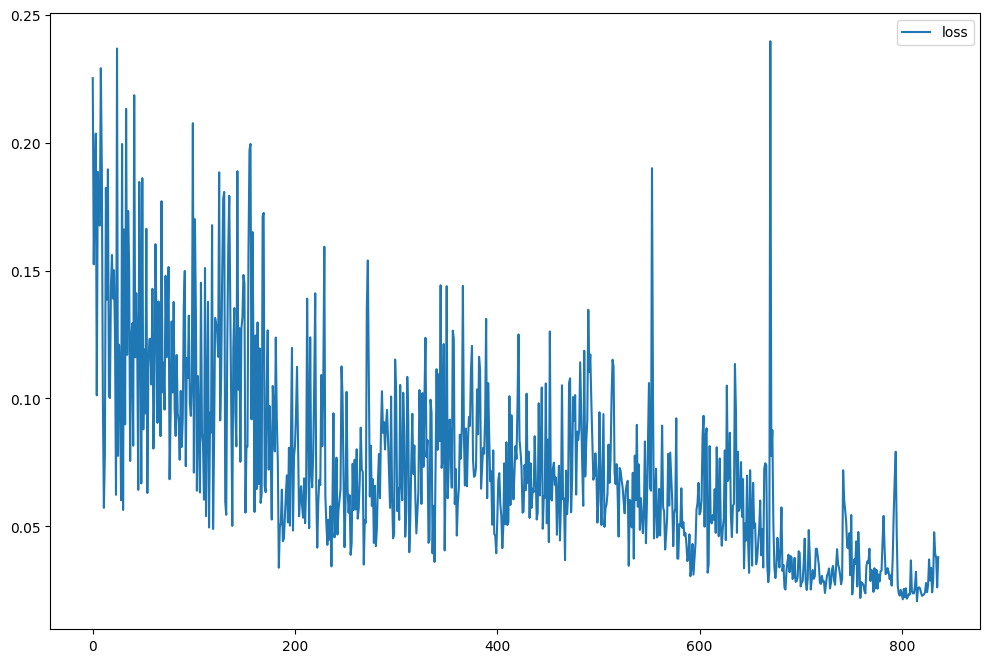

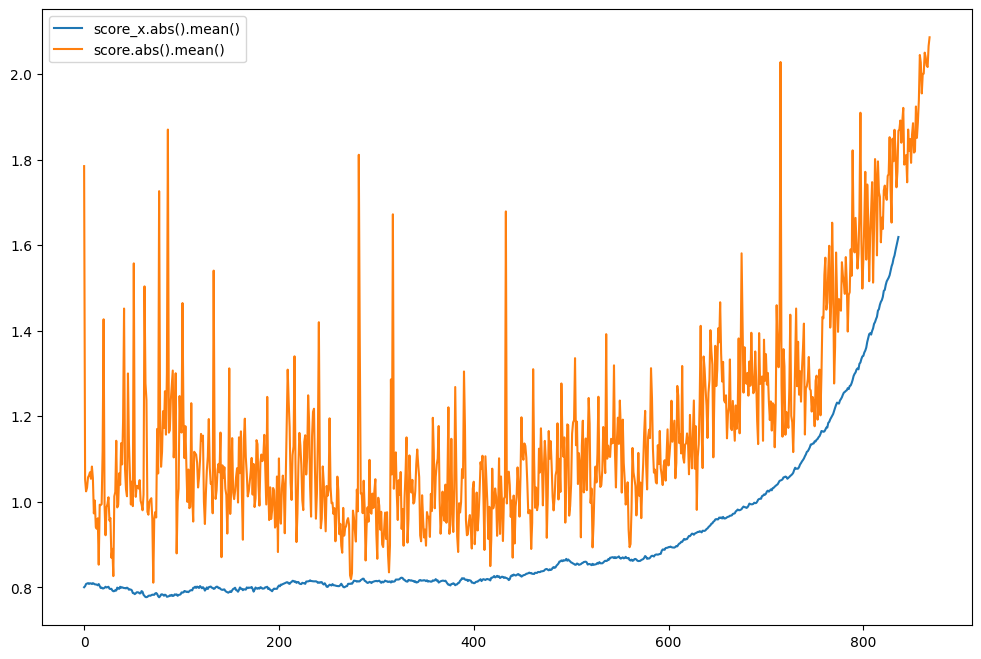

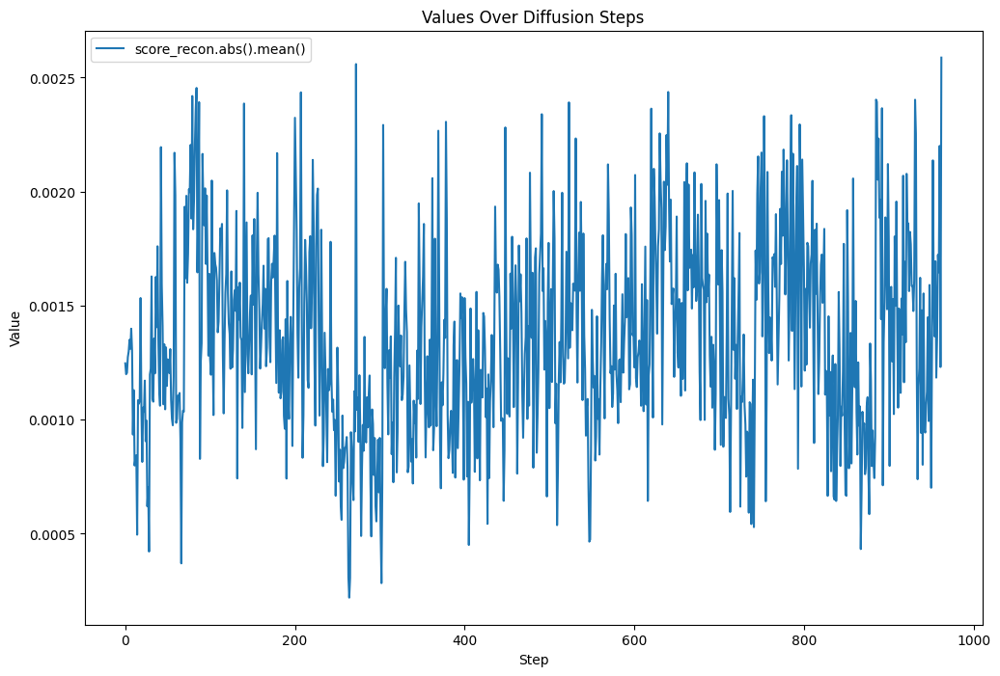

In [30]:
import numpy as np
import matplotlib.pyplot as plt

def remove_outliers(data, threshold_factor=1.5):
    q3, q1 = np.percentile(data, [75, 25])
    iqr = q3 - q1
    upper_bound = q3 + threshold_factor * iqr
    return [x for x in data if x <= upper_bound]


plt.figure(figsize=(12, 8))
plt.plot(remove_outliers(recon_loss_list), label='loss')
plt.legend()
plt.show()

plt.figure(figsize=(12, 8))
plt.plot(remove_outliers(score_x_list), label='score_x.abs().mean()')
plt.plot(remove_outliers(score_list), label='score.abs().mean()')
plt.legend()

plt.figure(figsize=(12, 8))

plt.plot(remove_outliers(score_recon_list), label='score_recon.abs().mean()')
plt.xlabel('Step')
plt.ylabel('Value')
plt.title('Values Over Diffusion Steps')
plt.legend()
# plt.ylim(0, 10)
plt.show()

In [32]:
from viz_x import viz_x, viz_pc
viz_pc(query[0][:query[0].shape[0]//3])
viz_x(x_0, model, device)

shape:  torch.Size([3, 256, 3]) torch.Size([3, 256]) torch.Size([3]) torch.Size([3, 1, 3])


Max: 0.46155468 Min -0.09034825


Max: 0.42388558 Min -0.22883967


Max: 0.51128244 Min -0.0027137212
